In [189]:
# activate package, basic imports + load data
include("/Users/federicoclaudi/Documents/Github/LocomotionControl/analysis/behavior/analysis_fixtures.jl")
include("/Users/federicoclaudi/Documents/Github/LocomotionControl/analysis/behavior/analysis_visuals.jl")
using HypothesisTests
using Glob, NaturalSort

using jcontrol.visuals
import jcontrol.visuals: arena
import jcontrol as jc

PLOTS_FOLDER = "/Users/federicoclaudi/Dropbox (UCL)/Rotation_vte/Writings/THESIS/Chpt3/Plots"

# load comparison points
cpoints, valid_points = get_comparison_points(trials; δs=1.0)

# load global solution
globalsolution = load_global_solution()
gs_speed = sqrt.(globalsolution.u .^ 2 .+ globalsolution.v .^ 2);
nothing

  Activating project at `~/Documents/Github/LocomotionControl/analysis/behavior`


@Info (Main):  Loaded 1021 trials 
  ╰──────────────────────────────────────────────── 
                      Tue, 03 May 2022 10:14:08 
@Info (Main):  After tortuosity analysis, discarded 9.109% of trials | 928

 
  │                trials left 
  ╰──────────────────────────────────────────────── 
                      Tue, 03 May 2022 10:14:08 


## MTM at curves with trials

We've run MTM at each curve with the trial's tracking data as initial conditions (see `analysis/behavior/mtm_at_curve_with_IC.jl`).
Now we load all the simulations data and we do analyses similar to those done in fig4 for the behavior data.


#### load data

Loaded 0 solutions for curve 4, 0/928 (0.0)%
Loaded 14 solutions for curve 2, 14/928 (1.51)%
Loaded 0 solutions for curve 3, 0/928 (0.0)%
Loaded 0 solutions for curve 1, 0/928 (0.0)%


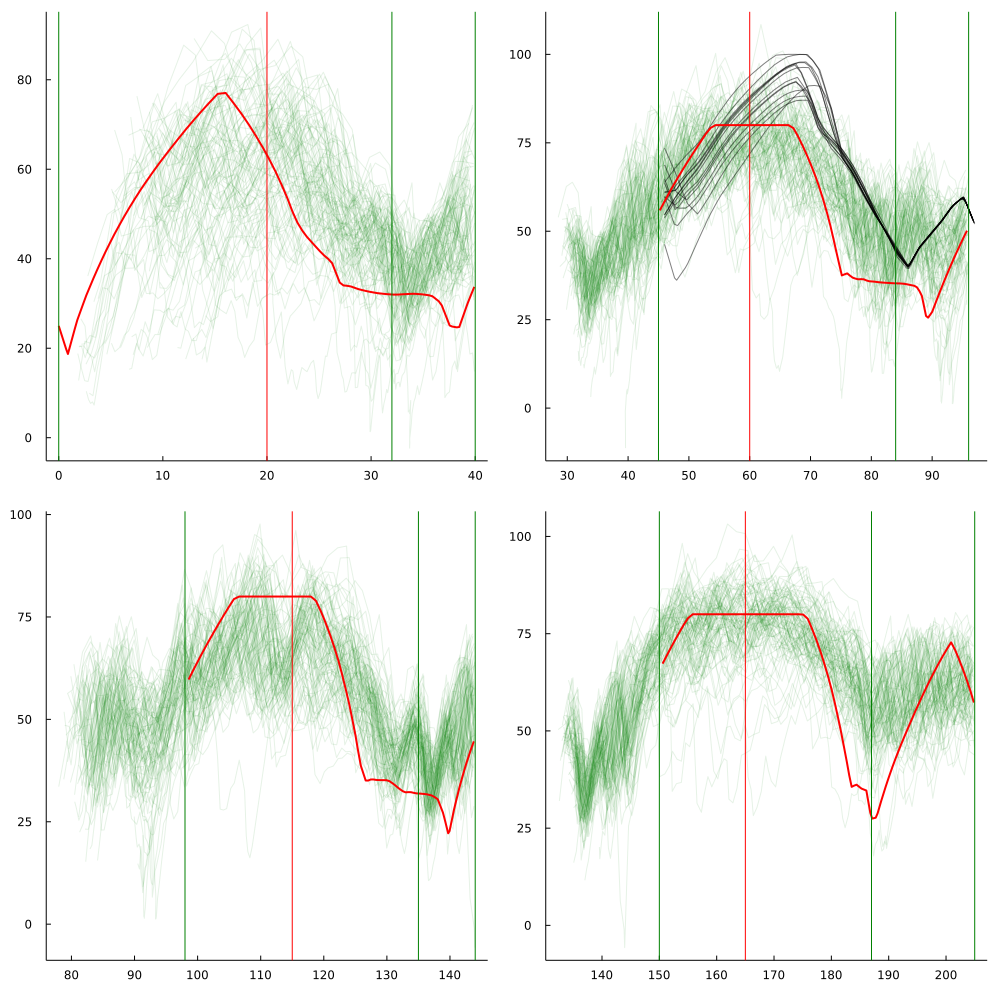

In [254]:
path = "/Users/federicoclaudi/Dropbox (UCL)/Rotation_vte/Locomotion/analysis/behavior/mtm_on_curve"

# load individual solutions
files = sort(glob("*.csv", path), lt=natural)

curves_solutions = Dict(
    1=>[], 2=>[], 3=>[], 4=>[]
)

for file in files
    fname = string(splitext(basename(file))[1])
    curve = parse(Int, fname[7])
    trial = parse(Int, fname[15:end])

    sol  = df2sol(DataFrame(CSV.File(file)))
    push!(curves_solutions[curve], sol)
end

for (k,v) in pairs(curves_solutions)
    N, M = length(v), length(trials)
    println("Loaded $(N) solutions for curve $(k), $(N)/$(M) ($(round(N/M*100; digits=2)))%")
end


# plot speed traces
plots = []
for (i, curve) in enumerate(curves)
    # plot speed trace of each solution for the curve
    plt = plot()

    # plot tracking data traces
    for trial in trials[1:100]
        _, _, start, stop = get_curve_indices(trial, curve.s0, curve.sf)
        start = start > 20 ? start - 20 : start
        plot!(
            trial.s[start:stop], trial.u[start:stop], color="green", lw=1, alpha=.1, label=nothing
        )
    end

    for sol in curves_solutions[i]
        plot!(sol.s, sol.u, color="black", lw=1, alpha=.5, label=nothing)
    end

    # plot the global solution speed
    start = findfirst(globalsolution.s .>= curve.s0)
    stop = findlast(globalsolution.s .<= curve.sf)
    plot!(globalsolution.s[start:stop], globalsolution.u[start:stop], color="red", lw=2, alpha=1, label=nothing)

    vline!([curve.s0, curve.s, curve.sf], color="green", label=nothing)
    vline!([curve.tpos], color="red", label=nothing)
    push!(plots, plt)
end

plot(plots...; legend=:bottomleft, grid=false,  size=(1000, 1000))

### Plot solutions tracking

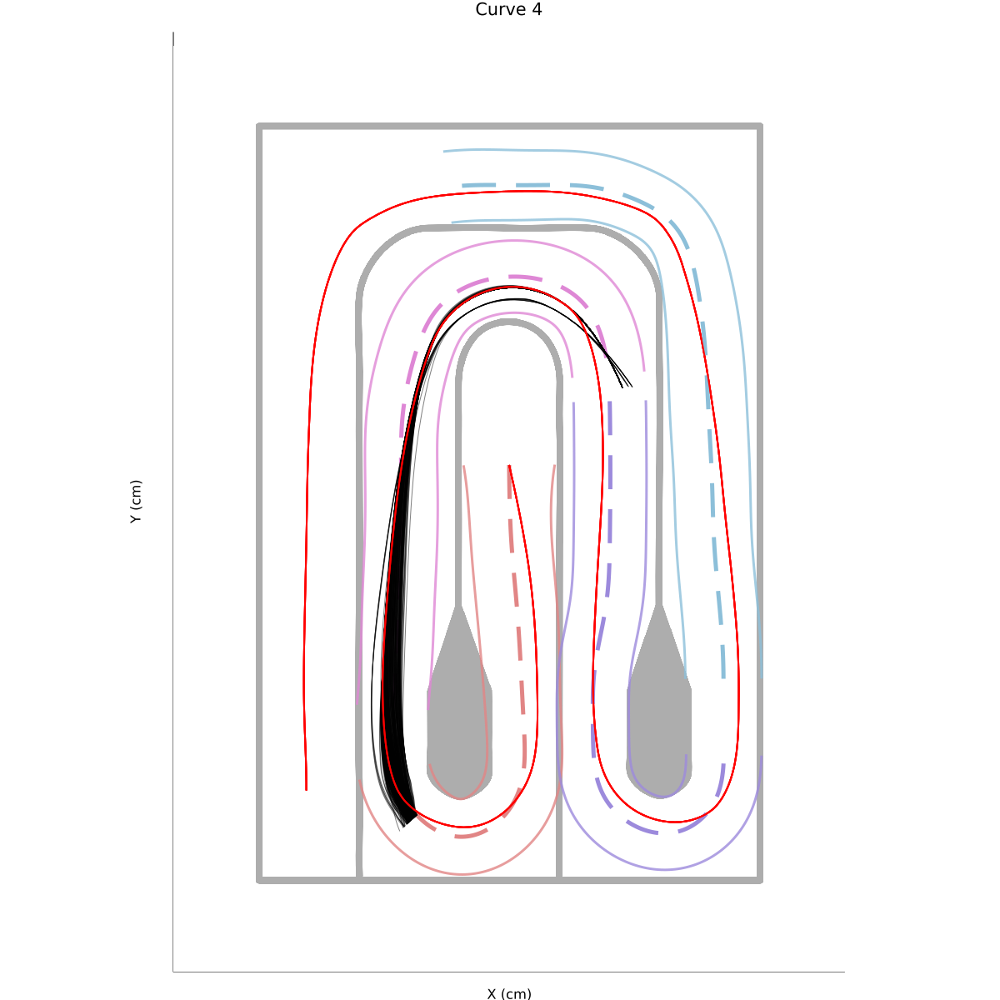

In [236]:
plt = draw(:arena)

for k in 1:4
    v = curves_solutions[k]
    curve = curves[k]

    track = jc.trim(FULLTRACK, curve.s0, curve.sf-curve.s0)
    draw!(track, color=curves_colors[k], Δp=50, alpha=1)

    plot!(globalsolution.x, globalsolution.y, color="red", linewidth=2, label=nothing)
    plot!(title="Curve $(k)", xticks=[], yticks=[])
    for sol in v
        plot!(sol.x, sol.y, color="black", lw=1, alpha=.5, label=nothing)
    end
end

plt

Get for each curve and each trial the frame at which the curve starts stopping/turning. 

Implementation is lifted from fig5 where it was tested

In [237]:
# get data
data = Dict(
    "frame"=>[],
    "curve"=>[],
    "class"=>[],
    "x"=>[],
    "y"=>[],
)

SKIP = 5

for (i, curve) in enumerate(curves)
    for sol in curves_solutions[i]
        # get when the models goes through the curve
        start = findfirst(sol.s .>= curve.s0)
        stop = findfirst(sol.s .>= curve.sf)

        # get position of peak speed
        t0 = findfirst(sol.s[start:stop] .>= curve.tpos) + start
        tf = findlast(sol.s[start:stop] .<= curve.s) + start

        # maxspeed = max(sol.u[start+SKIP:tf]...)
        # slowing_peak = findfirst(sol.u[start+SKIP:tf] .>= (maxspeed - 1)) + start + SKIP
        topspeed = max(sol.u[start:tf]...)
        p0 = findfirst(sol.u[start:tf] .>= (topspeed-.05))
        p1 = findlast(sol.u[start:tf] .>= (topspeed-.05))
        slowing_peak = (Int ∘ round)(p0 + (p1 - p0)/2) + start - 1

        # get position of start of turning
        th = 2.1
        turning_peak = findlast(abs.(sol.ω[t0:tf]) .< th) 
        turning_peak = isnothing(turning_peak) ? 1 : turning_peak
        turning_peak += t0

        # add everything to data
        push!(data["frame"], slowing_peak)
        push!(data["curve"], i)
        push!(data["class"], "slowing")
        push!(data["x"], sol.x[slowing_peak])
        push!(data["y"], sol.y[slowing_peak])

        # add turning
        push!(data["frame"], turning_peak)
        push!(data["curve"], i)
        push!(data["class"], "turning")
        push!(data["x"], sol.x[turning_peak])
        push!(data["y"], sol.y[turning_peak])
    end
end

data = DataFrame(data)

,class,curve,frame,x,y
,Any,Any,Any,Any,Any
1,slowing,2,37,11.6931,27.5847
2,turning,2,47,12.3891,35.5429
3,slowing,2,48,11.0672,29.1039
4,turning,2,57,12.1687,36.2254
5,slowing,2,47,11.1337,29.2486
6,turning,2,55,12.0818,35.57
7,slowing,2,42,11.1393,29.0371
8,turning,2,52,12.2752,36.916
9,slowing,2,44,10.9606,28.9598


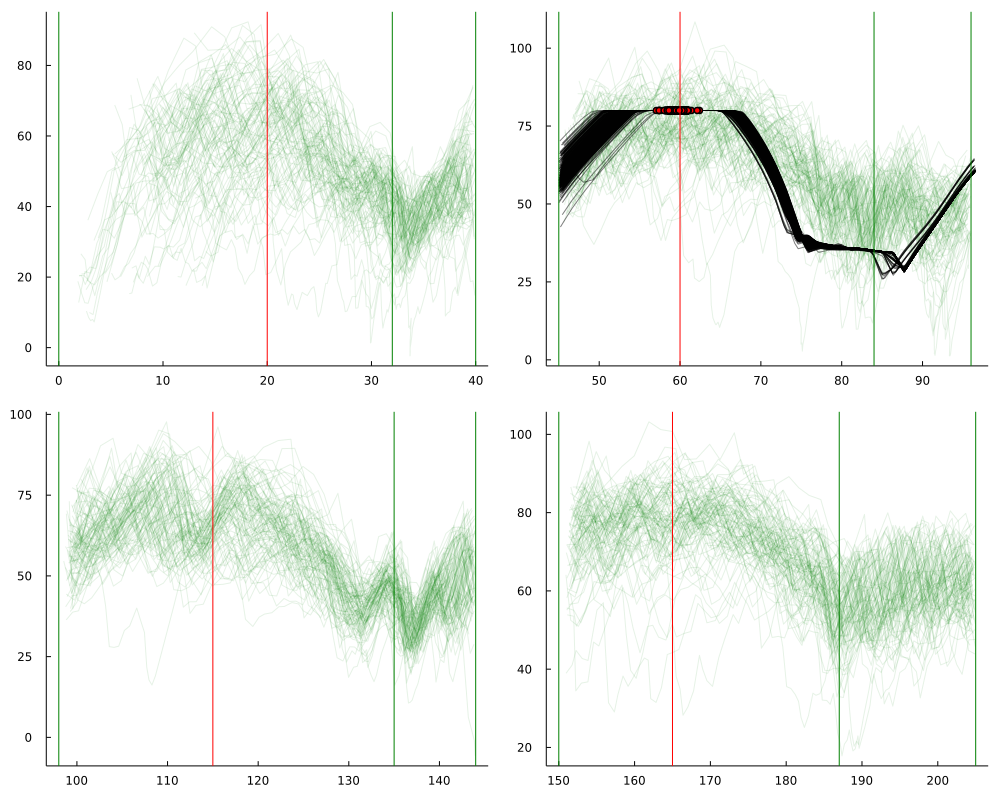

In [238]:
# plot slowing
plots = []

for (i, curve) in enumerate(curves)
    plt = plot()

    # plot tracking data traces
    for trial in trials[1:100]
        _, _, start, stop = get_curve_indices(trial, curve.s0, curve.sf)
        plot!(
            trial.s[start:stop], trial.u[start:stop], color="green", lw=1, alpha=.1, label=nothing
        )
    end

    slowing = filterdf(data, :curve, i, :class, "slowing")    
    for (n, sol) in enumerate(curves_solutions[i])
        # get when the models goes through the curve
        start = findfirst(sol.s .>= curve.s0)
        stop = findfirst(sol.s .>= curve.sf)

        plot!(sol.s[start:stop], sol.u[start:stop], color="black", lw=1, alpha=.5, label=nothing)
    end

    for (n, sol) in enumerate(curves_solutions[i])
        scatter!([sol.s[slowing.frame[n]]], [sol.u[slowing.frame[n]]], color="red", label=nothing)
    end

    vline!([curve.s0, curve.s, curve.sf], color="green", label=nothing)
    vline!([curve.tpos], color="red", label=nothing)

    push!(plots, plt)
end

plot(plots...; legend=:bottomleft, grid=false,  size=(1000, 800))

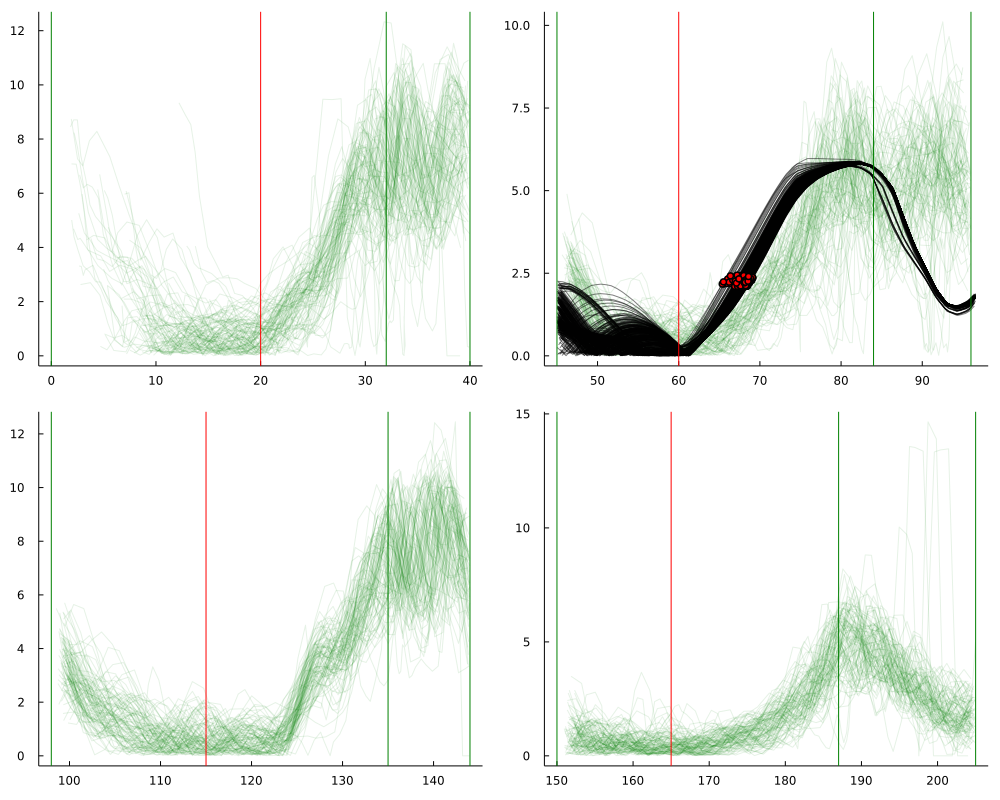

In [240]:
# plot turning
plots = []

for (i, curve) in enumerate(curves)
    plt = plot()

    # plot tracking data traces
    for trial in trials[1:100]
        _, _, start, stop = get_curve_indices(trial, curve.s0, curve.sf)
        plot!(
            trial.s[start:stop], abs.(trial.ω[start:stop]), color="green", lw=1, alpha=.1, label=nothing
        )
    end



    turning = filterdf(data, :curve, i, :class, "turning")
    for (n, sol) in enumerate(curves_solutions[i])
        # get when the models goes through the curve
        start = findfirst(sol.s .>= curve.s0)
        stop = findfirst(sol.s .>= curve.sf)

        plot!(sol.s[start:stop], abs.(sol.ω)[start:stop], color="black", lw=1, alpha=.5, label=nothing)
    end

    for (n, sol) in enumerate(curves_solutions[i])
        scatter!([sol.s[turning.frame[n]]], [abs.(sol.ω)[turning.frame[n]]], color="red", label=nothing)
    end

    vline!([curve.s0, curve.s, curve.sf], color="green", label=nothing)
    vline!([curve.tpos], color="red", label=nothing)

    push!(plots, plt)
end

plot(plots...; legend=:bottomleft, grid=false,  size=(1000, 800))

Plot 2D histogram of locations of slowing/turning for comparison with tracking data in Figure4.

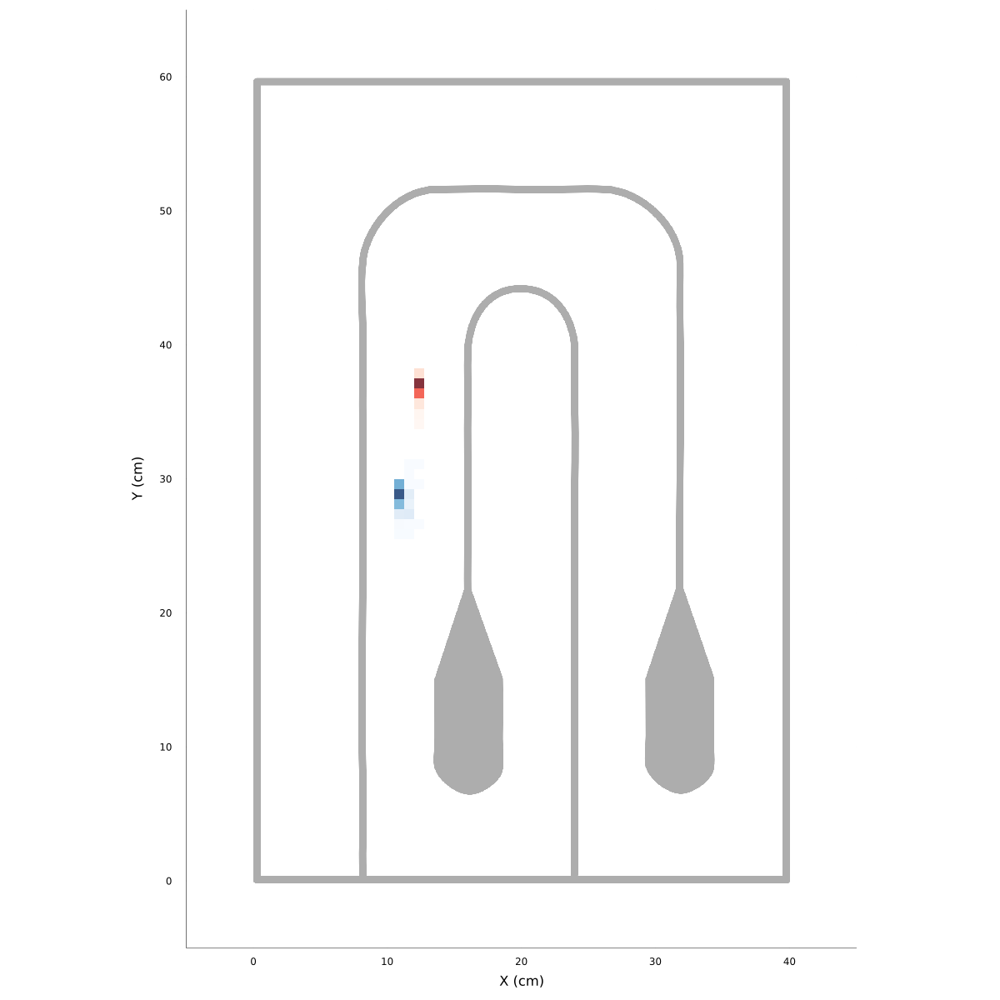

In [241]:
using Random, Distributions
d = Normal(0, .25)


function σ(x)
    return x
    # return x .+ rand(d, length(x))
end

plt = draw(:arena)

xbins = 0:.75:40
ybins = 0:.75:60

for i in 1:length(curves)
    slowing = filterdf(data, :curve, i, :class, "slowing")
    turning = filterdf(data, :curve, i, :class, "turning")

    histogram2d!(σ(slowing.x), σ(slowing.y), bins=(xbins, ybins),  alpha=.8, c=:Blues, colorbar_entry=false)
    histogram2d!(turning.x, turning.y, bins=(xbins, ybins),  alpha=.8, c=:Reds, colorbar_entry=false)    
end

# savefig(joinpath(PLOTS_FOLDER, "slowing_turning_2D_histo.svg"))
plt

Make delta s and delta t KDEs like for tracking data in Figure4